# Partie 1 — Statistique univariée

## Objectifs:

- calculer et interpréter les mesures de tendance centrale : moyenne, médiane, mode;

- Calculer et interpréter les mesures de dispersion : variance, écart-type, étendue, coefficient de variation;

- Utiliser les quartiles et l’IQR pour détecter des valeurs extrêmes (outliers);

- Analyser la forme d’une distribution (asymétrie / skewness, aplatissement / kurtosis);

- Décrire une variable qualitative avec des effectifs, proportions et graphiques;

- Utiliser des tests de normalité (Shapiro-Wilk, Kolmogorov–Smirnov) et un Q-Q plot;

- Décider s’il est raisonnable de supposer la normalité d’une variable.

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import joblib
import os

from scipy import stats
from scipy.stats import norm
from scipy.stats import chi2_contingency
from scipy.stats import pearsonr

In [55]:
# import d'une base de donnée

df = pd.read_csv('ecommerce_dataset.csv')

In [56]:
# Affichage

pd.set_option('display.max_rows', df.shape[0]+1)
df

,client_id,sexe,âge,revenu_mensuel,segment_age,revenu_cat,produit,canal_achat,montant_panier,panier_frequent,note_satisfaction,retour_produit,date_achat
0,1,Homme,50,3893.70,Mature,Moyen,Sport,Mobile,83.27,Non,2,Non,2023-05-28
1,2,Femme,39,2885.15,Adulte,Moyen,Électronique,Mobile,47.18,Oui,3,Non,2023-01-13
2,3,Homme,44,2369.53,Mature,Moyen,Sport,Mobile,72.28,Oui,4,Non,2023-03-13
3,4,Homme,38,3197.92,Adulte,Moyen,Électronique,Mobile,54.59,Non,3,Non,2023-05-07
4,5,Homme,20,3774.66,Jeune,Moyen,Sport,Mobile,75.30,Non,4,Non,2023-07-04
5,6,Femme,29,2599.90,Adulte,Moyen,Mode,Mobile,99.61,Non,3,Non,2023-12-28
6,7,Homme,44,2544.60,Mature,Moyen,Sport,Email,99.63,Non,2,Non,2023-11-21
7,8,Homme,39,2216.84,Adulte,Moyen,Sport,Mobile,99.56,Non,3,Non,2023-03-10
8,9,Homme,49,3968.84,Mature,Moyen,Sport,Mobile,111.24,Non,3,Non,2023-04-08
9,10,Femme,42,1674.42,Mature,Bas,Beauté,Mobile,23.82,Non,2,Oui,2023-05-06


In [57]:
df.shape

(15000, 13)

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   client_id          15000 non-null  int64  
 1   sexe               15000 non-null  object 
 2   âge                15000 non-null  int64  
 3   revenu_mensuel     15000 non-null  float64
 4   segment_age        15000 non-null  object 
 5   revenu_cat         15000 non-null  object 
 6   produit            15000 non-null  object 
 7   canal_achat        15000 non-null  object 
 8   montant_panier     15000 non-null  float64
 9   panier_frequent    15000 non-null  object 
 10  note_satisfaction  15000 non-null  int64  
 11  retour_produit     15000 non-null  object 
 12  date_achat         15000 non-null  object 
dtypes: float64(2), int64(3), object(8)
memory usage: 1.5+ MB


In [59]:
df.isna().sum().any()

False

In [60]:
df.dtypes

client_id              int64
sexe                  object
âge                    int64
revenu_mensuel       float64
segment_age           object
revenu_cat            object
produit               object
canal_achat           object
montant_panier       float64
panier_frequent       object
note_satisfaction      int64
retour_produit        object
date_achat            object
dtype: object

In [61]:
df.describe()

,client_id,âge,revenu_mensuel,montant_panier,note_satisfaction
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,7500.500000,37.664133,2999.014097,93.357107,3.217600
std,4330.271354,9.796074,864.568767,66.260809,0.967495
min,1.000000,18.000000,1000.000000,10.320000,1.000000
25%,3750.750000,31.000000,2399.410000,48.310000,2.000000
50%,7500.500000,38.000000,2985.695000,73.530000,3.000000
75%,11250.250000,44.000000,3582.872500,117.295000,4.000000
max,15000.000000,70.000000,6219.120000,929.970000,5.000000


In [62]:
df.describe(include='O')

,sexe,segment_age,revenu_cat,produit,canal_achat,panier_frequent,retour_produit,date_achat
count,15000,15000,15000,15000,15000,15000,15000,15000
unique,2,4,3,5,4,2,2,365
top,Homme,Adulte,Moyen,Électronique,Mobile,Non,Non,2023-02-27
freq,7521,7608,11288,3684,6030,10656,13440,61


Nous allons utiliser dans ce notebook :

- des variables quantitatives : âge, revenu_mensuel, montant_panier, note_satisfaction ;
- des variables qualitatives : sexe, segment_age, revenu_cat, produit, canal_achat, panier_frequent, retour_produit.

## Variable quantitative
Une variable quantitative prend des valeurs numériques (ex. : âge, revenu, montant du panier).

On distingue :

les variables continues (peuvent prendre une infinité de valeurs dans un intervalle);

les variables discrètes (valeurs entières, ex. nombre d’enfants).

Une variable quantitative est une variable numérique.

Une analyse univariée quantitative répond à 5 questions clés :

Quel est le niveau moyen ? → moyenne, médiane

Quelle est la variabilité ? → variance, écart-type, étendue

Comment se répartissent les observations ? → quartiles, quantiles, IQR

Quelle est la forme de la distribution ? → skewness, kurtosis

Comment visualiser efficacement ? → histogramme, KDE, boxplot.

# Variable quantitative à analyser : 'montant_panier'

In [63]:
df['montant_panier'].describe()

count    15000.000000
mean        93.357107
std         66.260809
min         10.320000
25%         48.310000
50%         73.530000
75%        117.295000
max        929.970000
Name: montant_panier, dtype: float64

## Mesures de tendance centrale

Les mesures de tendance centrale résument le **niveau "moyen"** de la variable.

Moyenne :
$$
\bar{x} = \frac{1}{n} \sum_{i=1}^{n}x_i
$$
 
Médiane : valeur qui coupe la distribution en deux parties égales (50% des valeurs en dessous, 50% au-dessus).

Mode : valeur la plus fréquente (surtout utile pour les distributions discrètes ou qualitatives).

In [64]:
# Calculs en Python

moyenne = df['montant_panier'].mean()
mediane  = df['montant_panier'].median()
mod = df['montant_panier'].mode()

print(f"Moyenne : {moyenne:.2f}")
print(f"Médiane : {mediane:.2f}")
print("Mode(s) :")
print(mod)

Moyenne : 93.36
Médiane : 73.53
Mode(s) :
0    62.12
Name: montant_panier, dtype: float64


**Interprétation** :

- Si la moyenne et la médiane sont proches, la distribution est relativement symétrique.
- Si la moyenne est nettement > médiane → asymétrie à droite (queue à droite).
- Si la moyenne est nettement < médiane → asymétrie à gauche.

## Mesures de dispersion


In [65]:
# Calcul de la variance, de l'écart-type, de l'étendue et du CV

variance = df['montant_panier'].var()         
ecartyp = df['montant_panier'].std()          
mini = df['montant_panier'].min()
maxi = df['montant_panier'].max()
etendue = maxi - mini
cv = (ecartyp / moyenne) * 100

print(f"Variance : {variance:.2f}")
print(f"Écart-type : {ecartyp:.2f}")
print(f"Min : {mini:.2f}")
print(f"Max : {maxi:.2f}")
print(f"Étendue : {etendue:.2f}")
print(f"Coefficient de variation : {cv:.2f} %")

Variance : 4390.49
Écart-type : 66.26
Min : 10.32
Max : 929.97
Étendue : 919.65
Coefficient de variation : 70.98 %


## Quartiles, quantiles, IQR et outliers
Pour analyser la répartition d’une variable quantitative, on utilise des mesures de position : quartiles, quantiles, IQR et bornes d’outliers.

Quartiles (Q1, Q2, Q3)

Les quartiles découpent la distribution en 4 segments de même effectif :

Q1 (1er quartile) : 25% des valeurs sont en dessous
    
Q2 (médiane) : 50% des valeurs sont en dessous
    
Q3 (3e quartile) : 75% des valeurs sont en dessous
    
Ils permettent de comprendre où se concentre la majorité des données.

In [66]:
# Calcul des quartiles, de l'IQR et des bornes pour détecter les outliers

q1 = df['montant_panier'].quantile(0.25)
q2 = df['montant_panier'].quantile(0.5)
q3 = df['montant_panier'].quantile(0.75)
iqr = q3 - q1

borne_inf = q1 - 1.5 * iqr
borne_sup = q3 + 1.5 * iqr

print(f"Q1 : {q1:.2f}")
print(f"Q2 (médiane) : {q2:.2f}")
print(f"Q3 : {q3:.2f}")
print(f"IQR : {iqr:.2f}")
print(f"Borne inférieure (outliers) : {borne_inf:.2f}")
print(f"Borne supérieure (outliers) : {borne_sup:.2f}")

outliers = df['montant_panier'][(df['montant_panier'] < borne_inf) | (df['montant_panier'] > borne_sup)]
print(f"\nNombre d'outliers détectés : {outliers.shape[0]}")

Q1 : 48.31
Q2 (médiane) : 73.53
Q3 : 117.30
IQR : 68.98
Borne inférieure (outliers) : -55.17
Borne supérieure (outliers) : 220.77

Nombre d'outliers détectés : 813


## Forme de la distribution : asymétrie et aplatissement
Deux indicateurs classiques :

Asymétrie (skewness) : mesure la symétrie de la distribution.

- skewness ≈ 0 → distribution à peu près symétrique ;
- skewness > 0 → queue à droite ;
- skewness < 0 → queue à gauche.

Aplatissement (kurtosis) : mesure la forme des queues de distribution.

- kurtosis ≈ 0 (en version « excess kurtosis ») → proche de la loi normale ;
- kurtosis > 0 → distribution plus « pointue », queues plus lourdes ;
- kurtosis < 0 → distribution plus « plate ».

In [67]:
# Calcul de l'asymétrie et de l'aplatissement

skewness = df['montant_panier'].skew()
kurtosis = df['montant_panier'].kurtosis()

print(f"Skewness (asymétrie) : {skewness:.3f}")
print(f"Kurtosis (aplatissement) : {kurtosis:.3f}")

Skewness (asymétrie) : 2.150
Kurtosis (aplatissement) : 7.737


## Visualisations (histogramme, KDE, boxplot)
Les graphiques permettent de voir la distribution :

**Histogramme** : fréquence des valeurs dans des classes;

**KDE** (Kernel Density Estimation) : estimation lissée de la densité;

**Boxplot** : résumé visuel (médiane, quartiles, outliers).

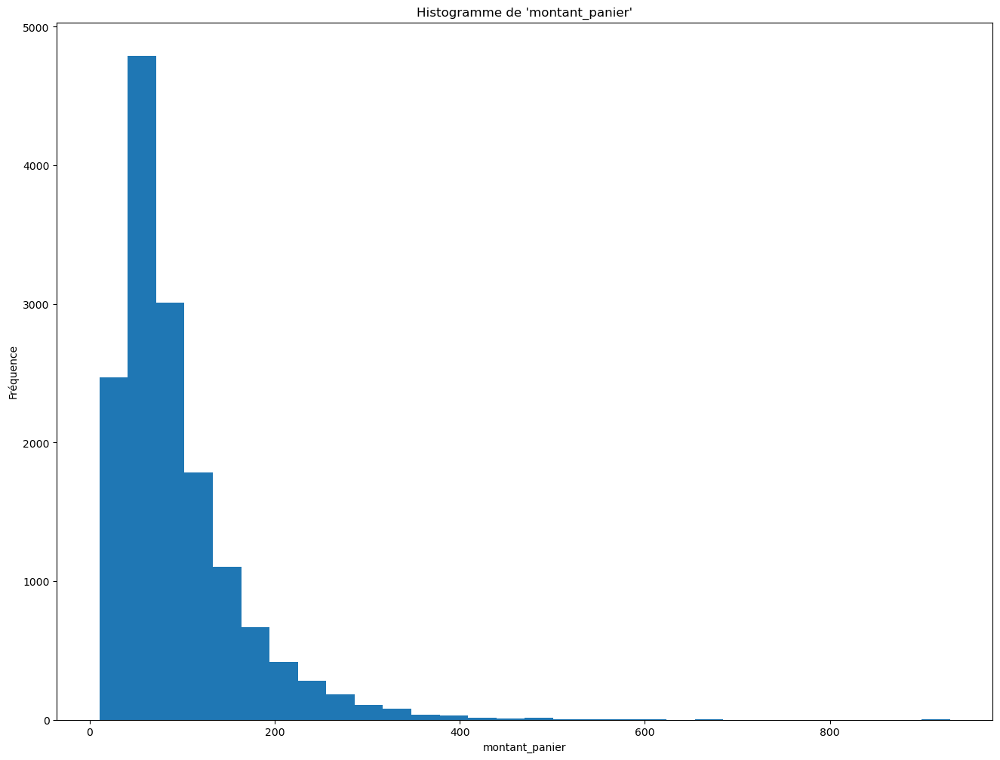

In [68]:
#  Histogramme

plt.figure(figsize=(16, 12))
plt.hist(df['montant_panier'], bins=30)
plt.title("Histogramme de 'montant_panier'")
plt.xlabel('montant_panier')
plt.ylabel("Fréquence")
plt.show()

C:\Users\kanko\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


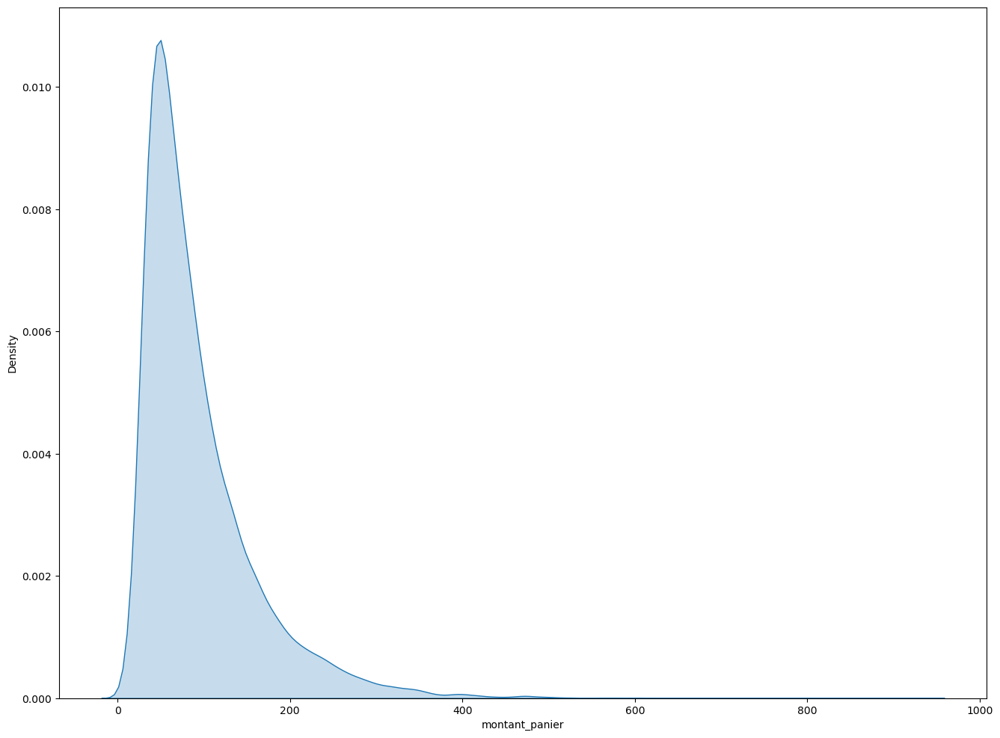

In [69]:
plt.figure(figsize=(16, 12))
sns.kdeplot(df['montant_panier'], fill='True')
plt.show()

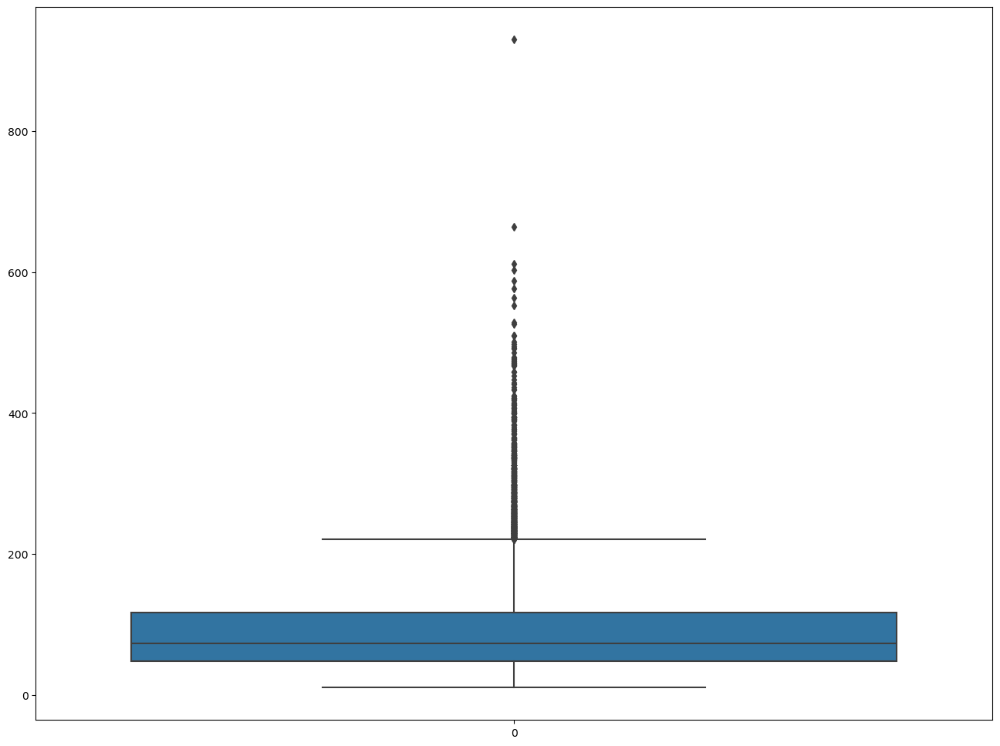

In [70]:
# Boxplot

plt.figure(figsize=(16, 12))
sns.boxplot(df['montant_panier'])
plt.show()

## Variable qualitative
Une variable qualitative décrit des catégories : sexe, produit, canal d'achat, etc.

On distingue :

- les variables nominales (sans ordre naturel : couleur, pays…)
- les variables ordinales (avec ordre logique : faible/moyen/fort, notes 1–5…)

Une analyse univariée qualitative répond souvent à 4 questions clés :

Quel est le type de variable ? → nominale ou ordinale

Comment se répartissent les catégories ? → effectifs, proportions

Quelle catégorie domine ? → mode, concentration.

Comment visualiser efficacement ? → barplot, countplot, treemap, pie chart (rarement)

Pour illustrer, nous allons utiliser la variable **canal_achat.**

In [71]:
df['canal_achat'].unique

<bound method Series.unique of 0         Mobile
1         Mobile
2         Mobile
3         Mobile
4         Mobile
5         Mobile
6          Email
7         Mobile
8         Mobile
9         Mobile
10        Mobile
11        Mobile
12         Email
13           App
14         Email
15         Email
16         Email
17        Mobile
18         Email
19         Email
20        Mobile
21           App
22           App
23       Desktop
24        Mobile
25        Mobile
26       Desktop
27        Mobile
28        Mobile
29        Mobile
30       Desktop
31       Desktop
32       Desktop
33        Mobile
34           App
35       Desktop
36       Desktop
37       Desktop
38       Desktop
39           App
40       Desktop
41       Desktop
42         Email
43        Mobile
44        Mobile
45       Desktop
46        Mobile
47        Mobile
48       Desktop
49       Desktop
50       Desktop
51        Mobile
52        Mobile
53        Mobile
54         Email
55        Mobile
56        Mobile


**Effectifs et proportions**
Pour décrire une variable qualitative, on regarde :

- les effectifs (nombre d'observations par modalité);
- les proportions ou pourcentages.

In [72]:
# effectifs

effectifs = df['canal_achat'].value_counts()
effectifs

canal_achat
Mobile     6030
Desktop    4418
Email      3042
App        1510
Name: count, dtype: int64

In [73]:
# proportions

proportions = df['canal_achat'].value_counts(normalize=True)*100
proportions

canal_achat
Mobile     40.200000
Desktop    29.453333
Email      20.280000
App        10.066667
Name: proportion, dtype: float64

## Graphiques: barplot, pie chart

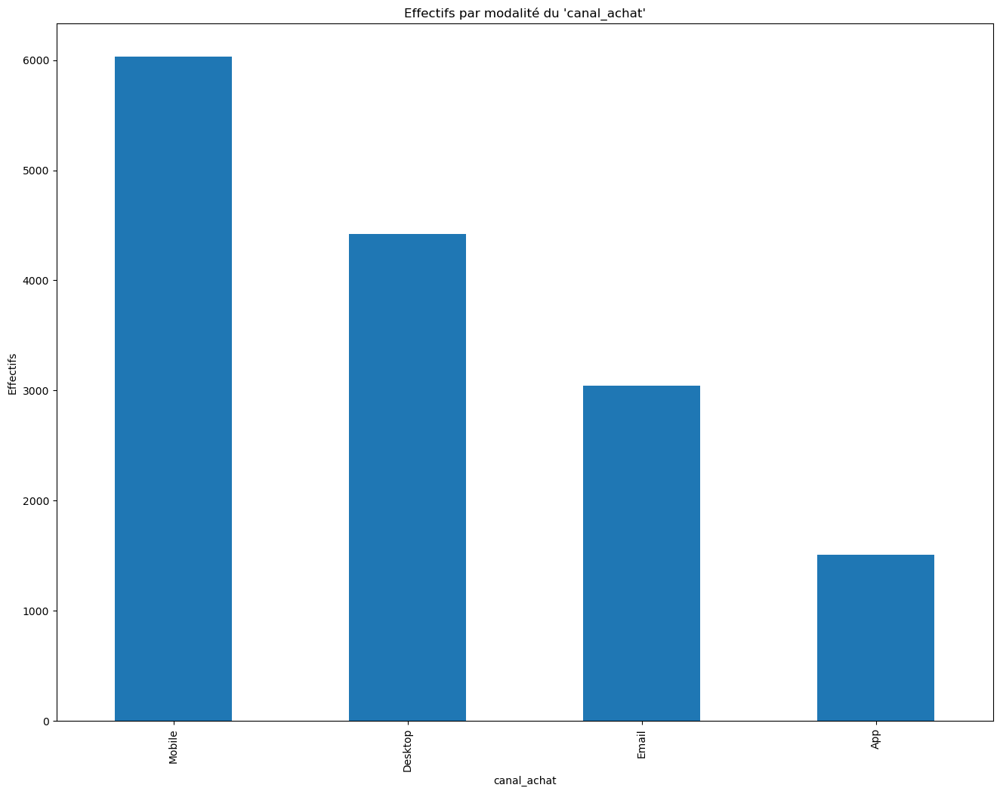

In [74]:
# Diagramme en barre (barplot)

plt.figure(figsize=(16, 12))
effectifs.plot(kind='bar')
plt.title("Effectifs par modalité du 'canal_achat'")
plt.xlabel('canal_achat')
plt.ylabel('Effectifs')
plt.show()

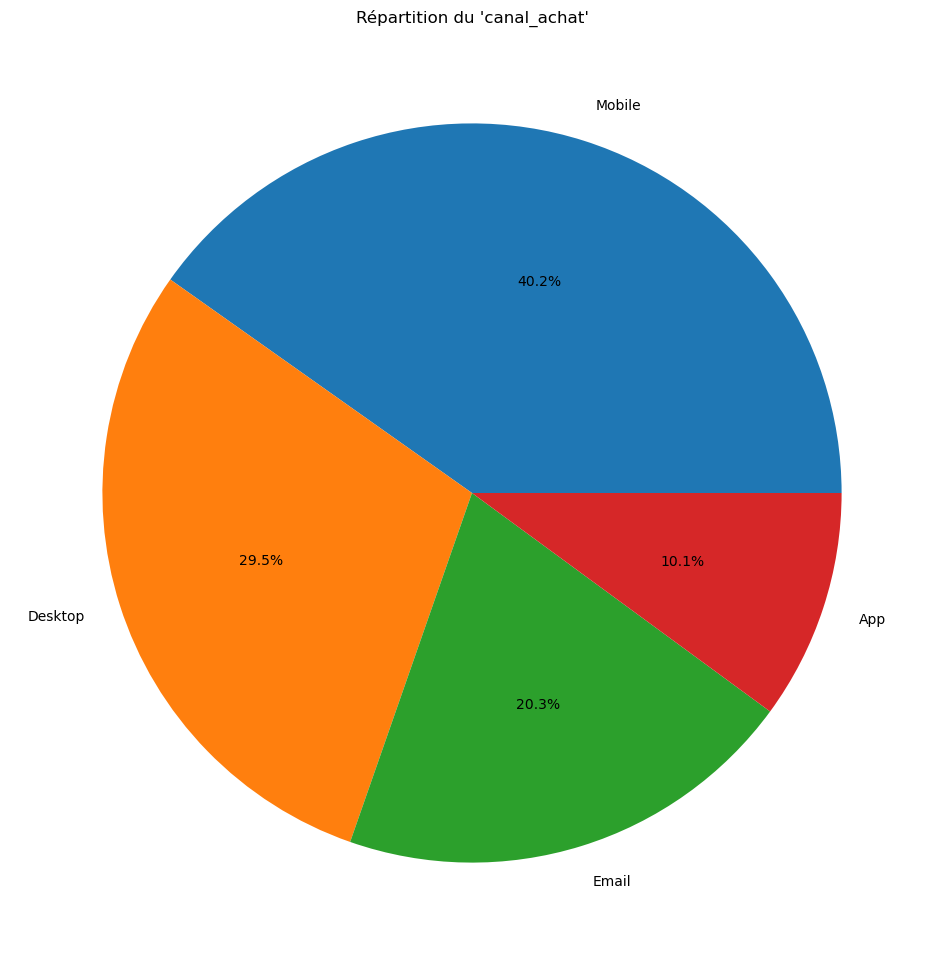

In [75]:
# Diagramme circulaire : pie chart

plt.figure(figsize=(16, 12))
proportions.plot(kind='pie', autopct="%1.1f%%")
plt.title("Répartition du 'canal_achat'")
plt.ylabel("")
plt.show()

## Tests de normalité
Dans beaucoup de méthodes statistiques (tests paramétriques, régressions, etc.), on suppose qu’une variable suit approximativement une loi normale.

Il est donc utile de :

- visualiser la distribution;
- utiliser des **tests de normalité** :
- Shapiro–Wilk;
- Kolmogorov–Smirnov (KS);

examiner un **Q-Q plot** (quantile-quantile).

## Test de Shapiro–Wilk

**Hypothèse nulle H0** : la variable suit une loi normale;

**Hypothèse alternative H1** : la variable ne suit pas une loi normale.

On regarde la **p-valeur** :

- si p-valeur < 0,05 → on **rejette H0** → la variable n'est **pas normale** (au seuil de 5%);
- si p-valeur ≥ 0,05 → on **ne rejette pas H0** → la normalité est **plausible**.

In [76]:
# test de shapiro-wilk sur la variable quantitative 'montant_panier'

shapiro_stat, p_value = stats.shapiro(df['montant_panier'].sample(min(len(df['montant_panier']), 500), random_state=101))
print(f"Statistique de shapiro-Wilk: {shapiro_stat: .4f}")
print(f"p_value : {p_value: .4f}")
print(f"Resultat : {'Normalité acceptée' if p_value>0.05 else 'Normalitée rejetée'}\n")

Statistique de shapiro-Wilk:  0.7920
p_value :  0.0000
Resultat : Normalitée rejetée



## Test de Kolmogorov–Smirnov (KS)
On peut comparer la distribution observée à une loi normale théorique (même moyenne et même écart-type).

Là encore, on raisonne en termes de **p-valeur** :

- p-valeur faible → la distribution observée est très différente de la normale;
- p-valeur élevée → pas de différence significative détectée.

In [77]:
# test de Kolmogorov-smirnov

ks_stat, p_value = stats.kstest(df['montant_panier'], "norm")
print(f"Statistique de ks: {ks_stat:.4f}")
print(f"p_value: {p_value:.4f}")
print(f"Resulta: {'Normalité acceptée' if p_value >0.05 else 'Normalité rejetée'}\n")

Statistique de ks: 1.0000
p_value: 0.0000
Resulta: Normalité rejetée



## Q-Q plot (Quantile-Quantile plot)
Le Q-Q plot compare les quantiles de la distribution observée à ceux d’une loi normale.

- Si les points sont proches d’une droite, alors la normalité est plausible ;
- Si les points s’écartent fortement (surtout dans les queues), alors la distribution n’est pas normale.

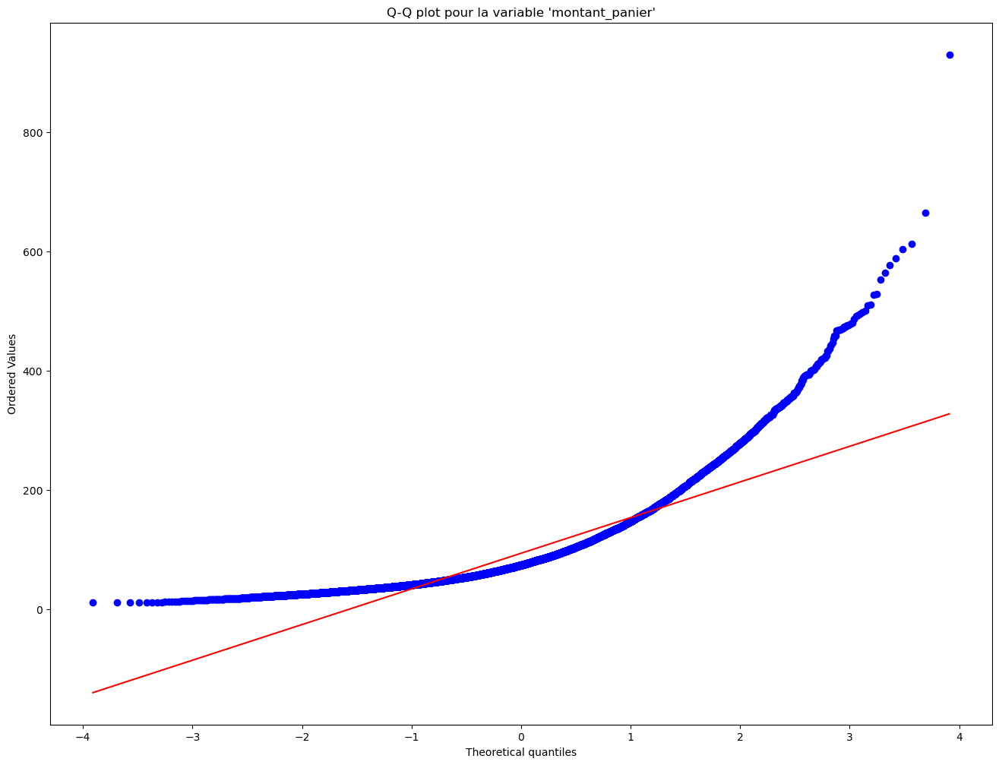

In [78]:
# Q-Q plot

plt.figure(figsize=(16, 12))
stats.probplot(df['montant_panier'], dist='norm', plot=plt)
plt.title("Q-Q plot pour la variable 'montant_panier'")
plt.show()

## Décision : normal ou pas ?
En pratique, on combine :

- la forme des graphiques (histogramme, KDE, Q-Q plot);
- les statistiques descriptives (skewness, kurtosis);
- les tests de normalité (p-valeurs).

Règle pratique :

- si la distribution est visuellement proche d’une cloche,
- skewness et kurtosis pas trop extrêmes,
- p-valeurs des tests pas trop faibles (par ex. > 0,05),

alors on peut approximer la variable par une **loi normale** et utiliser des **tests paramétriques**.

Sinon, mieux vaut envisager :

des transformations (log, sqrt, etc.);
ou des méthodes / tests non paramétriques (ex. : test de Wilcoxon, test de Mann–Whitney, etc.).

# Statistique bivariées

Analyse des relations entre deux variables

## Cas 1 : montant_panier et revenu_mensuel

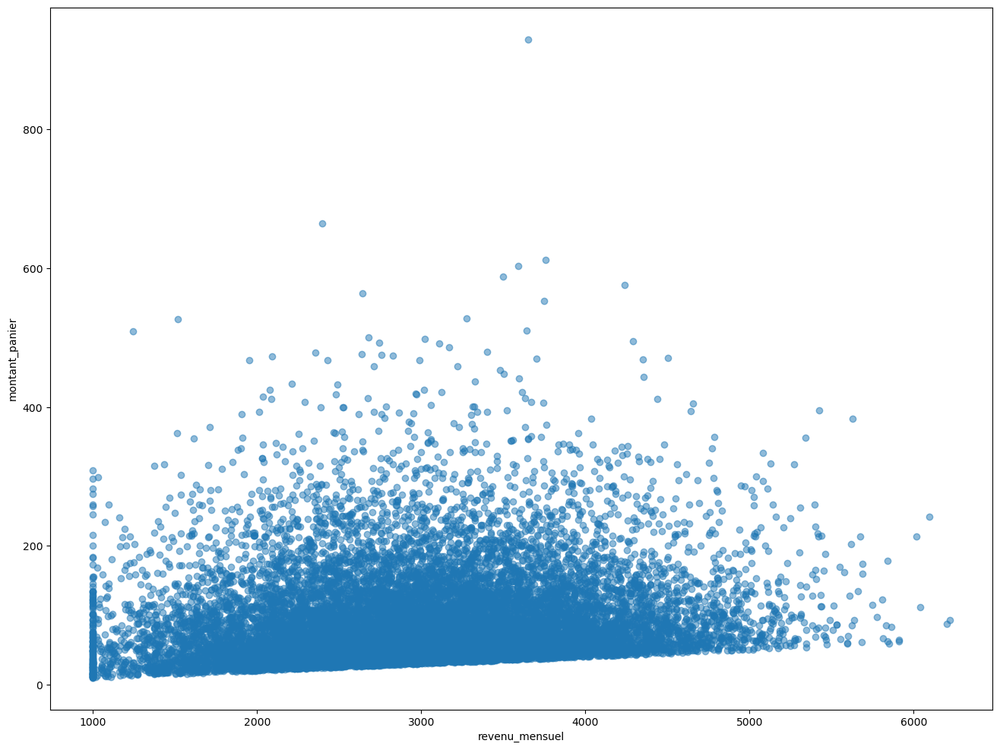

In [79]:
# variables quantitatives 

x = df['revenu_mensuel']
y = df['montant_panier']

plt.figure(figsize=(16, 12))
plt.scatter(x=x, y=y, alpha=0.5 )
plt.xlabel("revenu_mensuel")
plt.ylabel("montant_panier")
plt.show()

In [80]:
# covariance
cov_xy = np.cov(x, y, ddof=1)[0, 1]

# correlation de pearson
pearson_r, pearson_p = stats.pearsonr(x, y)

# correlation de Kendall
kendall_tau, kendall_p = stats.kendalltau(x, y)

# correlation de spearman
spearman_rho, spearman_p = stats.spearmanr(x, y)

print(" Covariance :", cov_xy)
print(f" Corrélation de Pearson : r = {pearson_r:.3f} (p = {pearson_p:.3e})")
print(f" Corrélation de Spearman : ρ = {spearman_rho:.3f} (p = {spearman_p:.3e})")
print(f" Corrélation de Kendall : τ = {kendall_tau:.3f} (p = {kendall_p:.3e})")

 Covariance : 7974.862474043824
 Corrélation de Pearson : r = 0.139 (p = 8.627e-66)
 Corrélation de Spearman : ρ = 0.209 (p = 3.977e-147)
 Corrélation de Kendall : τ = 0.143 (p = 5.134e-151)


- La covariance indique seulement si X et Y varient dans le même sens.
- Les corrélations normalisent la covariance et deviennent comparables et interprétables.
- Pearson = linéaire, Spearman = monotone, Kendall = robuste.

# Cas 2: sexe - montant_panier

In [81]:
df.groupby('sexe')['montant_panier'].describe()

,count,mean,std,min,25%,50%,75%,max
sexe,,,,,,,,
Femme,7479.0,87.985717,62.056393,10.32,45.05,69.83,111.41,664.40
Homme,7521.0,98.698502,69.787790,11.43,51.34,77.94,124.25,929.97


In [82]:
df.groupby("sexe")["montant_panier"].agg(
    moyenne = 'mean',
    mediane = 'median',
    ecart_type = 'std',
    variance = 'var',
    minimum = 'min',
    maximun = 'max',
    q1 = lambda x: x.quantile(0.25),
    q2 = 'median',
    q3 = lambda x: x.quantile(0.75),
    iqr = lambda x: x.quantile(0.75) - x.quantile(0.25),
    etendue = lambda x: x.max() - x.min()
)

,moyenne,mediane,ecart_type,variance,minimum,maximun,q1,q2,q3,iqr,etendue
sexe,,,,,,,,,,,
Femme,87.985717,69.83,62.056393,3850.995886,10.32,664.40,45.05,69.83,111.41,66.36,654.08
Homme,98.698502,77.94,69.787790,4870.335673,11.43,929.97,51.34,77.94,124.25,72.91,918.54


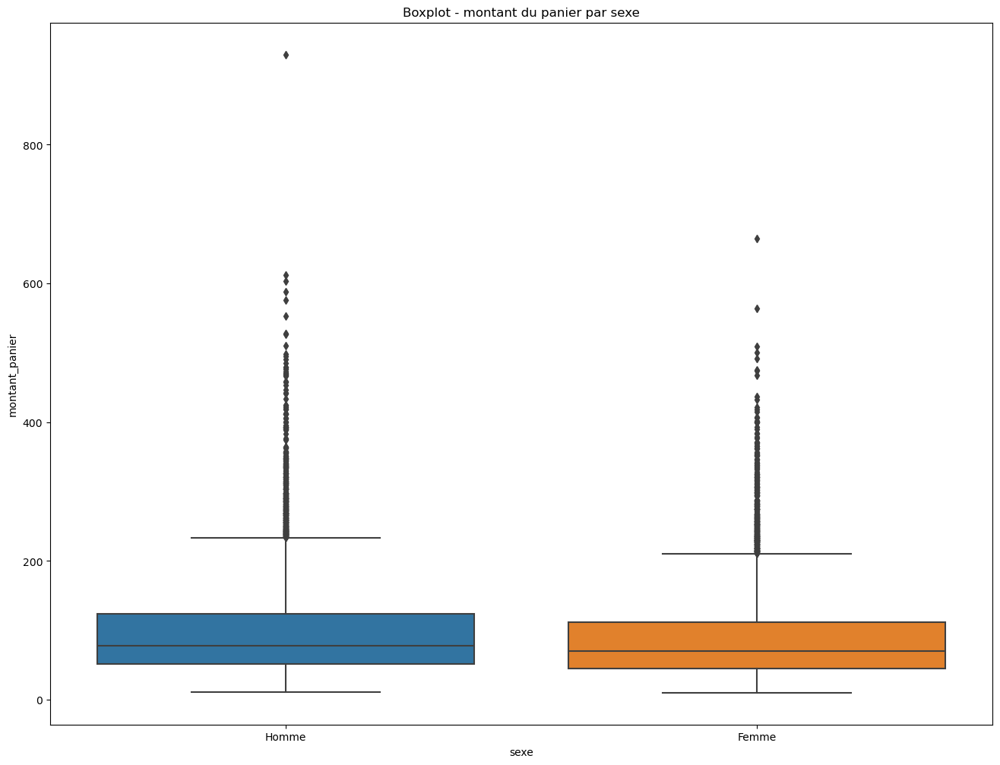

In [83]:
# boxplot

plt.figure(figsize=(16, 12))
sns.boxplot(data=df,
           x="sexe",
           y="montant_panier")
plt.title("Boxplot - montant du panier par sexe")
plt.show()

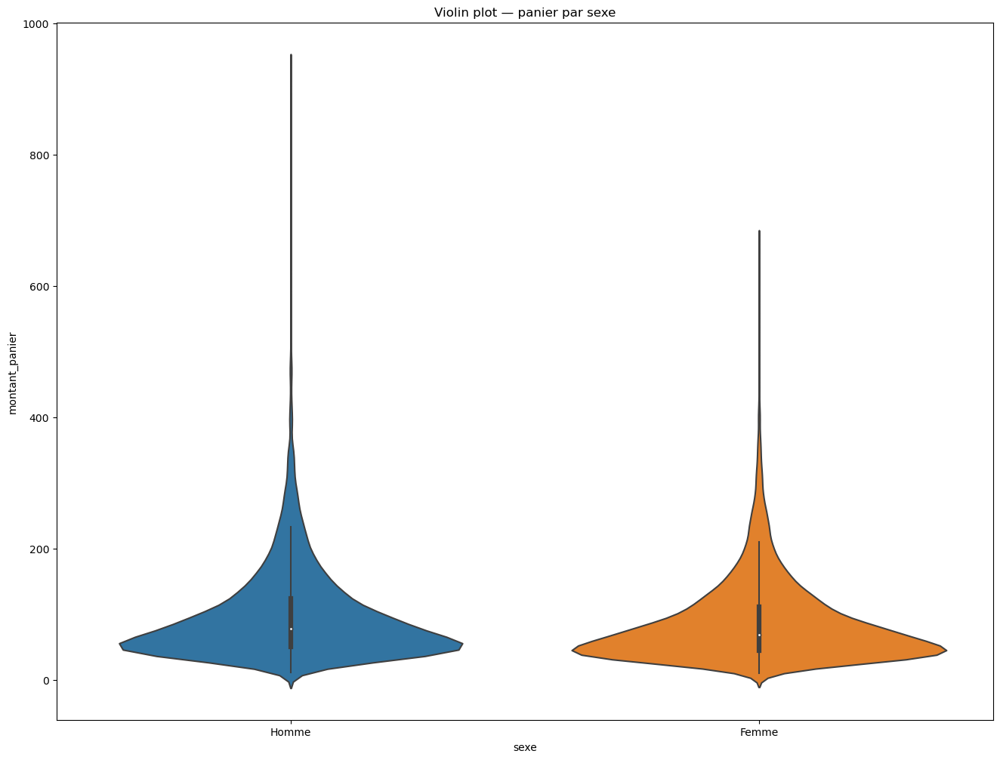

In [84]:
plt.figure(figsize=(16, 12))
sns.violinplot(data=df,
               x="sexe", y="montant_panier")
plt.title("Violin plot — panier par sexe")
plt.show()

In [85]:
# Trois modalités ou plus : segment_age & montant_panier

df.groupby("segment_age")["montant_panier"].agg(
    moyenne = 'mean',
    mediane = 'median',
    ecart_type = 'std',
    variance = 'var',
    minimum = 'min',
    maximun = 'max',
    q1 = lambda x: x.quantile(0.25),
    q2 = 'median',
    q3 = lambda x: x.quantile(0.75),
    iqr = lambda x: x.quantile(0.75) - x.quantile(0.25),
    etendue = lambda x: x.max() - x.min()
)

,moyenne,mediane,ecart_type,variance,minimum,maximun,q1,q2,q3,iqr,etendue
segment_age,,,,,,,,,,,
Adulte,93.912940,73.85,67.283033,4527.006478,10.32,929.97,48.5625,73.85,117.2150,68.6525,919.65
Jeune,92.168079,73.62,63.279226,4004.260479,11.32,470.16,48.7100,73.62,115.6500,66.9400,458.84
Mature,92.670004,72.72,65.595479,4302.766874,10.37,603.40,47.7625,72.72,117.2725,69.5100,593.03
Senior,102.859880,86.46,70.089715,4912.568110,23.21,498.11,51.6550,86.46,129.4950,77.8400,474.90


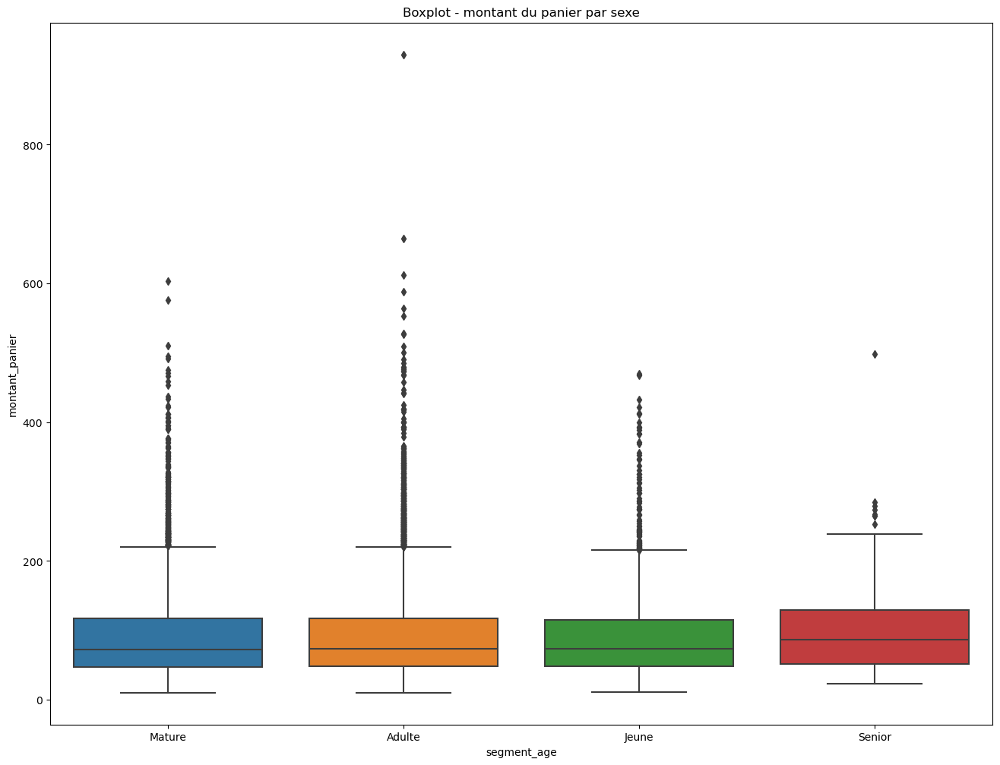

In [86]:
# boxplot

plt.figure(figsize=(16, 12))
sns.boxplot(data=df,
           x="segment_age",
           y="montant_panier")
plt.title("Boxplot - montant du panier par sexe")
plt.show()

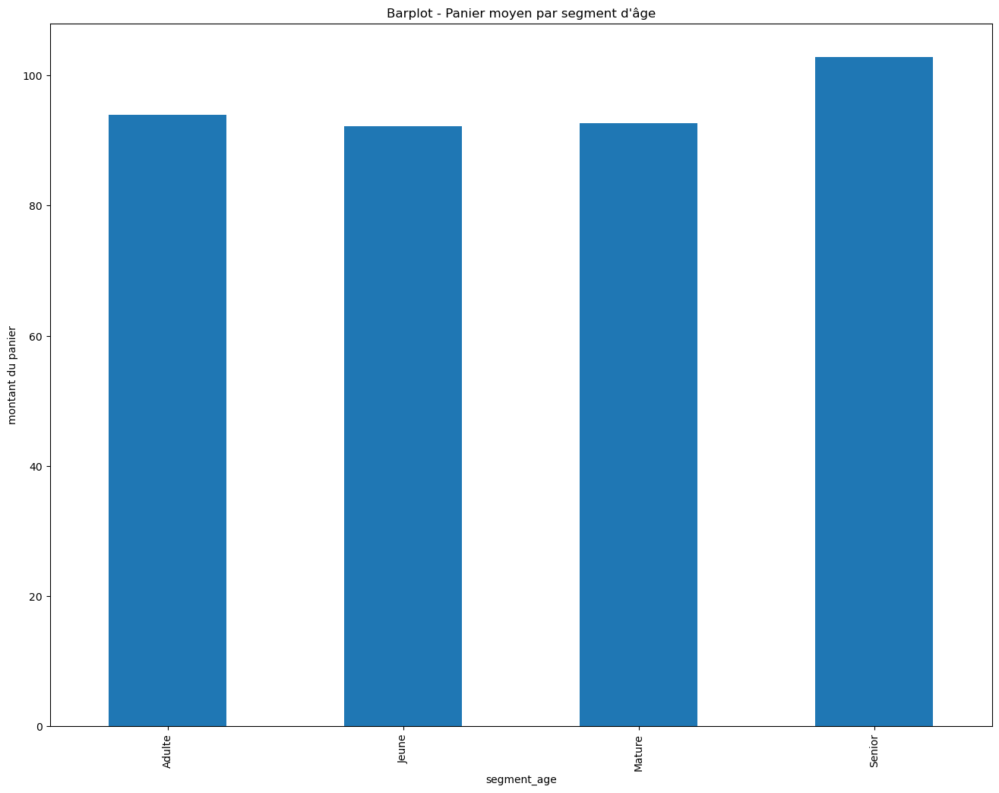

In [87]:
# panier moyen par segment d'âge

means = df.groupby("segment_age")["montant_panier"].mean()

plt.figure(figsize=(16, 12))
means.plot(kind="bar")
plt.ylabel("montant du panier")
plt.title("Barplot - Panier moyen par segment d'âge")
plt.show()

# Cas 3: sexe & retour_produit

In [88]:
# Tableau de contingence
table = pd.crosstab(df['sexe'], df['retour_produit'])
table

retour_produit,Non,Oui
sexe,,
Femme,6722,757
Homme,6718,803


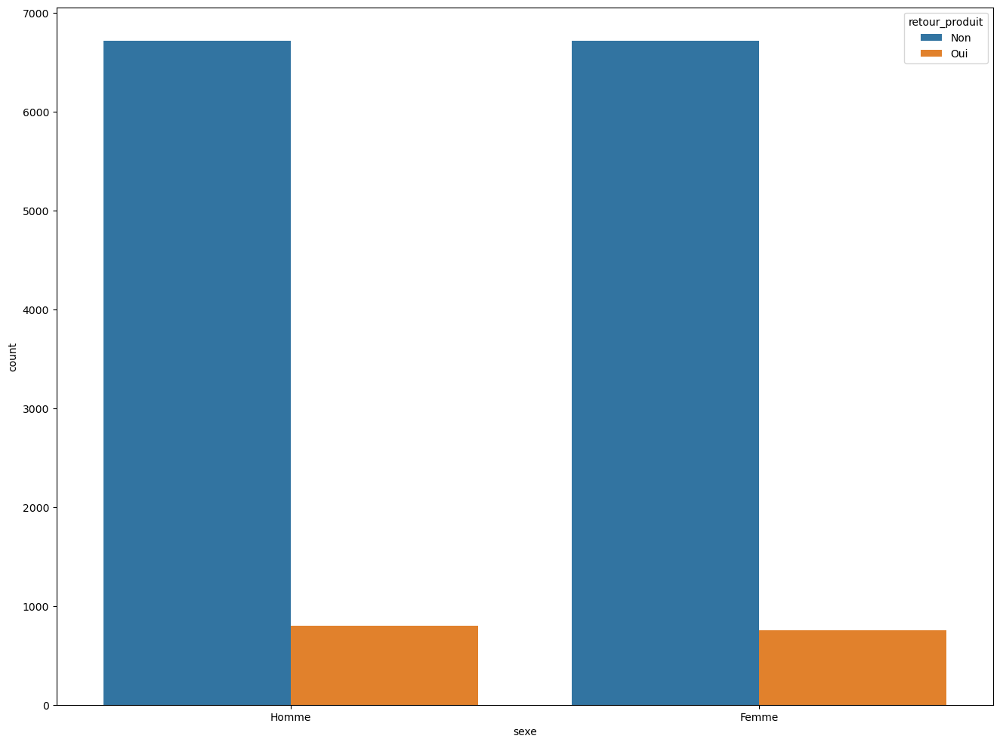

In [89]:
plt.figure(figsize=(16, 12))
sns.countplot(data=df,
              x="sexe", 
              hue="retour_produit")
plt.show()

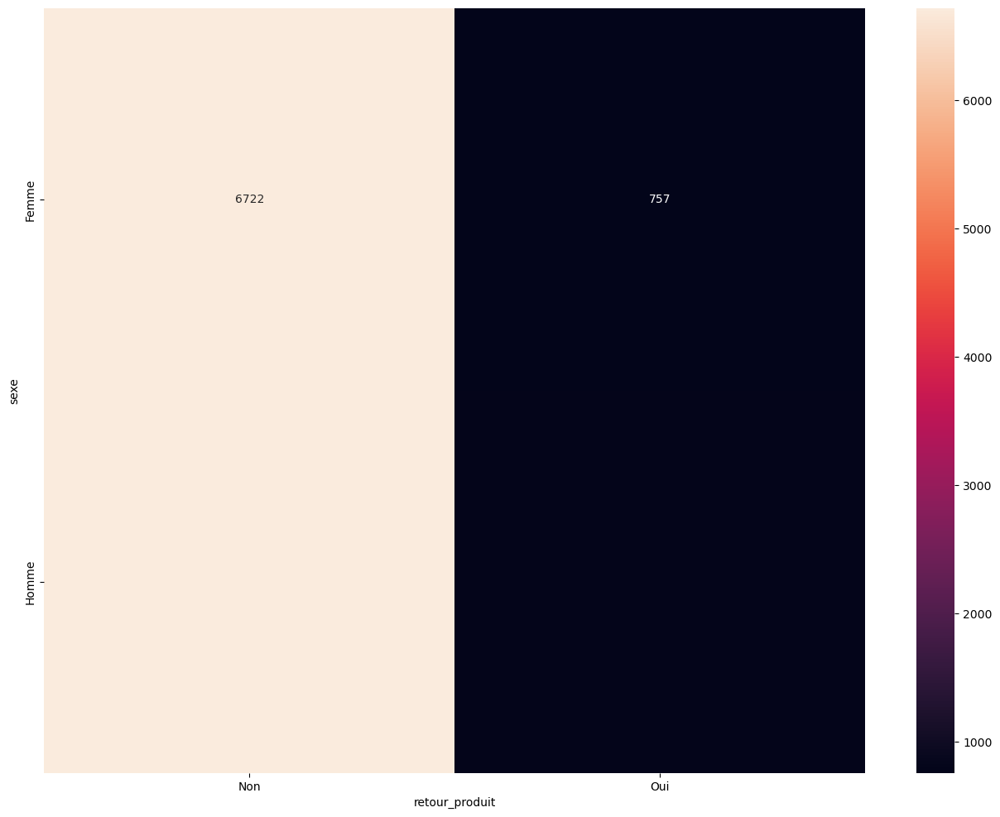

In [90]:
plt.figure(figsize=(16, 12))
sns.heatmap(table, annot=True, fmt="d", )
plt.show()

In [93]:
# Tableau de contingence brute

table = pd.crosstab(df['sexe'], df['retour_produit'])

# Tableau des proportions
table_prop = table.div(table.sum(axis=1), axis=0)*100


In [94]:
table_prop

retour_produit,Non,Oui
sexe,,
Femme,89.878326,10.121674
Homme,89.323228,10.676772


<Figure size 1600x1200 with 0 Axes>

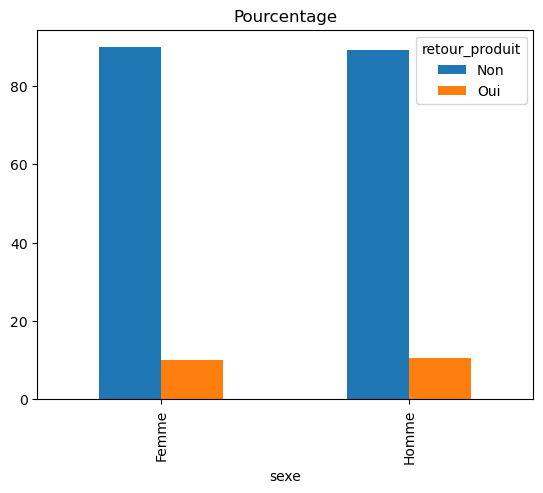

In [95]:
plt.figure(figsize=(16, 12))
table_prop.plot(kind="bar")
plt.title("Répartition en pourcentage de retour produit par sexe")
plt.title("Pourcentage")
plt.show()

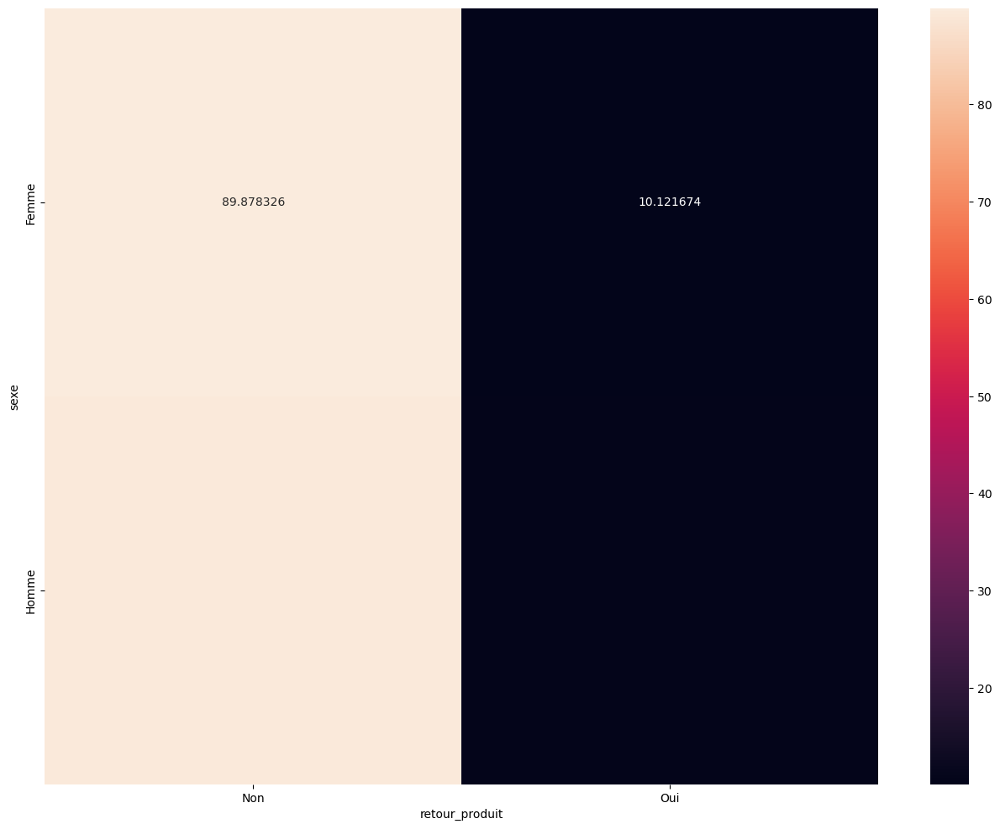

In [97]:
plt.figure(figsize=(16, 12))
sns.heatmap(table_prop, annot=True, fmt="1f", )
plt.show()

# Statistique bivariée et tests statistiques

## Introduction aux tests statistiques

## Pourquoi faire un test statistique ?
Un test statistique permet de répondre à des questions du type :

- Les moyennes de deux groupes sont-elles vraiment différentes ?
- Cette corrélation est-elle significativement différente de 0 ?
- Deux variables qualitatives sont-elles indépendantes ?

Comme on travaille sur un **échantillon**, on ne peut pas être sûr à 100 %.  
Un test statistique permet de décider si l'effet observé est **compatible avec le hasard ou non**.

##  Hypothèses H0 et H1
Pour chaque test, on pose :

- H0 (hypothèse nulle) : "rien ne se passe", aucune différence, aucune relation.
- H1 (hypothèse alternative) : il y a une différence, une relation, un effet.
    
Exemples :

- t-test :

H0 : les deux moyennes sont égales  
H1 : les moyennes sont différentes
    
- Chi² :

H0 : les deux variables qualitatives sont indépendantes  
H1 : elles sont associées

## p-valeur et seuil de décision
La p-valeur est la probabilité d’obtenir un résultat au moins aussi extrême que celui observé,
en supposant **H0 vraie**.

Règle pratique la plus courante :

- si p-valeur < 0.05 → on rejette H0 (effet significatif au seuil de 5 %)
- si p-valeur ≥ 0.05 → on ne rejette pas H0 (pas assez de preuves pour conclure)

## Tests paramétriques vs non paramétriques
- Paramétriques : reposent sur des hypothèses fortes (normalité, variances homogènes)
→ t-test, ANOVA, corrélation de Pearson…

- Non paramétriques : reposent sur les rangs ou les ordres
→ Mann–Whitney, Wilcoxon, Kruskal–Wallis, Spearman, Kendall…

Avant de choisir un test, on vérifie donc :

1. Type de variables (quanti / quali)
2. Nombre de groupes (2 ou plus)
3. Normalité approximative (Shapiro, histogrammes)
4. Homogénéité des variances (Levene)
5. Taille d’échantillon (petit / grand)

## Un exemple : Quanti & Quanti ('revenu_mensuel' / 'montant_panier')

In [98]:
x = df['revenu_mensuel']
y = df['montant_panier']

# covariance
cov_xy = np.cov(x, y, ddof=1)[0, 1]

# correlation de pearson
pearson_r, pearson_p = stats.pearsonr(x, y)

# correlation de Kendall
kendall_tau, kendall_p = stats.kendalltau(x, y)

# correlation de spearman
spearman_rho, spearman_p = stats.spearmanr(x, y)

print(" Covariance :", cov_xy)
print(f" Corrélation de Pearson : r = {pearson_r:.3f} (p = {pearson_p:.3e})")
print(f" Corrélation de Spearman : ρ = {spearman_rho:.3f} (p = {spearman_p:.3e})")
print(f" Corrélation de Kendall : τ = {kendall_tau:.3f} (p = {kendall_p:.3e})")

 Covariance : 7974.862474043824
 Corrélation de Pearson : r = 0.139 (p = 8.627e-66)
 Corrélation de Spearman : ρ = 0.209 (p = 3.977e-147)
 Corrélation de Kendall : τ = 0.143 (p = 5.134e-151)


## Interprétation rapide
- Signe de la corrélation → sens de la relation (positive / négative)
- Valeur absolue → force de la relation (faible / modérée / forte)
- p-valeur → significativité statistique

In [99]:
# Un exemple Quali & Quanti

var_quali = "sexe"
var_quanti = "montant_panier"

# description
df[[var_quali, var_quanti]].groupby(var_quali).describe()

montant_panier                                                     \
               count       mean        std    min    25%    50%     75%   
sexe                                                                      
Femme         7479.0  87.985717  62.056393  10.32  45.05  69.83  111.41   
Homme         7521.0  98.698502  69.787790  11.43  51.34  77.94  124.25   

               
          max  
sexe           
Femme  664.40  
Homme  929.97

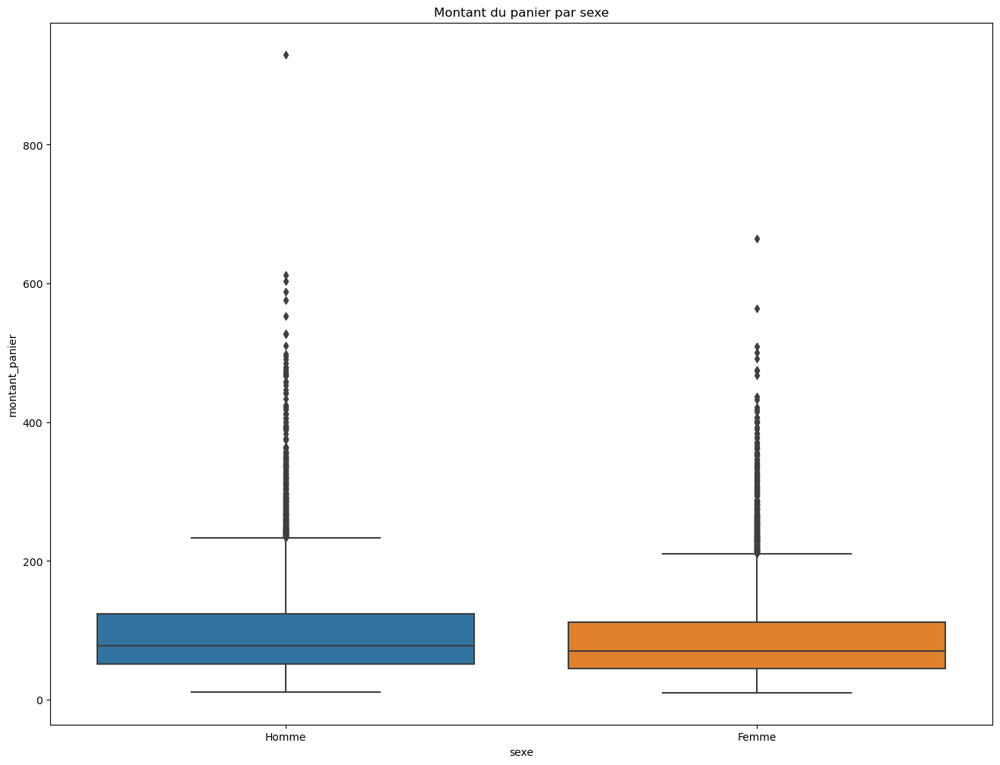

In [100]:
# visualisation

plt.figure(figsize=(16, 12))
sns.boxplot(data=df,
           x=var_quali,
           y=var_quanti)
plt.title("Montant du panier par sexe (barplot)")
plt.show()

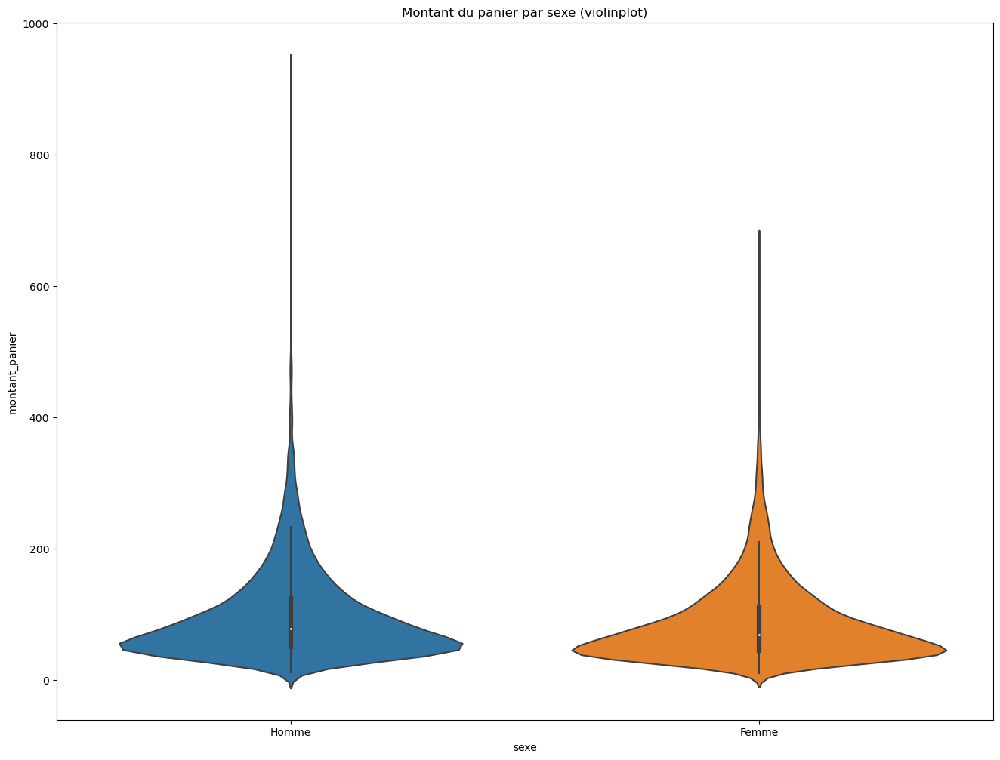

In [103]:
# visualisation

plt.figure(figsize=(16, 12))
sns.violinplot(data=df,
           x=var_quali,
           y=var_quanti)
plt.title("Montant du panier par sexe (violinplot)")
plt.show()

## Vérification des hypothèse : Normalité - Variance

In [111]:
from scipy.stats import shapiro, levene

# 1. Séparer les données par groupe
groupes = {}
for label, g in df.groupby(var_quali):
    groupes[label] = g[var_quanti].dropna()

# 2. Test de normalité pour chaque groupe
print("Test de Shapiro-Wilk (normalité)\n")

for label, valeurs in groupes.items():
    # Limite à 500 valeurs max
    echantillon = valeurs.sample(
        n=min(len(valeurs), 500),
        random_state=42
    )
    
    stat, p = shapiro(echantillon)
    print(f"{label} : stat={stat:.3f}, p={p:.3f}, n={len(valeurs)}")

# 3. Test de Levene (égalité des variances)
labels = list(groupes.keys())
g1, g2 = groupes[labels[0]], groupes[labels[1]]

stat_lev, p_lev = levene(g1, g2)

print("\nTest de Levene (égalité des variances)")
print(f"stat={stat_lev:.3f}, p={p_lev:.3f}")

Test de Shapiro-Wilk (normalité)

Femme : stat=0.797, p=0.000, n=7479
Homme : stat=0.721, p=0.000, n=7521

Test de Levene (égalité des variances)
stat=31.399, p=0.000


## t-test indépendat et Mann-WhitneyU

In [112]:
from scipy import stats
from scipy.stats import mannwhitneyu

# -----------------------------
# 1. Test t de Student
# (on suppose que les variances sont égales)
# -----------------------------

stat_t_student, p_value_student = stats.ttest_ind(
    g1,
    g2,
    equal_var=True
)

print("Test t de Student (variances égales)")
print(f"Statistique t = {stat_t_student:.3f}")
print(f"p-value = {p_value_student:.3e}\n")


# -----------------------------
# 2. Test t de Welch
# (variances différentes)
# -----------------------------

stat_t_welch, p_value_welch = stats.ttest_ind(
    g1,
    g2,
    equal_var=False
)

print("Test t de Welch (variances différentes)")
print(f"Statistique t = {stat_t_welch:.3f}")
print(f"p-value = {p_value_welch:.3e}\n")


# -----------------------------
# 3. Test non paramétrique
# de Mann–Whitney
# -----------------------------

stat_mw, p_value_mw = mannwhitneyu(
    g1,
    g2,
    alternative="two-sided"
)

print("Test de Mann–Whitney")
print(f"Statistique U = {stat_mw:.3f}")
print(f"p-value = {p_value_mw:.3e}")


Test t de Student (variances égales)
Statistique t = -9.933
p-value = 3.536e-23

Test t de Welch (variances différentes)
Statistique t = -9.936
p-value = 3.431e-23

Test de Mann–Whitney
Statistique U = 25182676.500
p-value = 1.326e-28


## Conclusion
1. On regarde la normalité (Shapiro + graphes)
2. On regarde les variances (Levene)
3. On utilise t-test (Welch) si c’est acceptable, sinon Mann–Whitney  
On Conclut sur :
- l’existence ou non d’une différence
- le sens et l’ampleur de la différence (moyennes + graphes)

## Plus 3 modalités ('segment_age' & 'montant_panier')

In [123]:
var_quali_multi = "segment_age"
var_quanti_multi = "montant_panier"

df[[var_quali_multi, var_quanti_multi]].groupby(var_quali_multi).describe().T

segment_age                Adulte        Jeune       Mature      Senior
montant_panier count  7608.000000  1676.000000  5550.000000  166.000000
               mean     93.912940    92.168079    92.670004  102.859880
               std      67.283033    63.279226    65.595479   70.089715
               min      10.320000    11.320000    10.370000   23.210000
               25%      48.562500    48.710000    47.762500   51.655000
               50%      73.850000    73.620000    72.720000   86.460000
               75%     117.215000   115.650000   117.272500  129.495000
               max     929.970000   470.160000   603.400000  498.110000

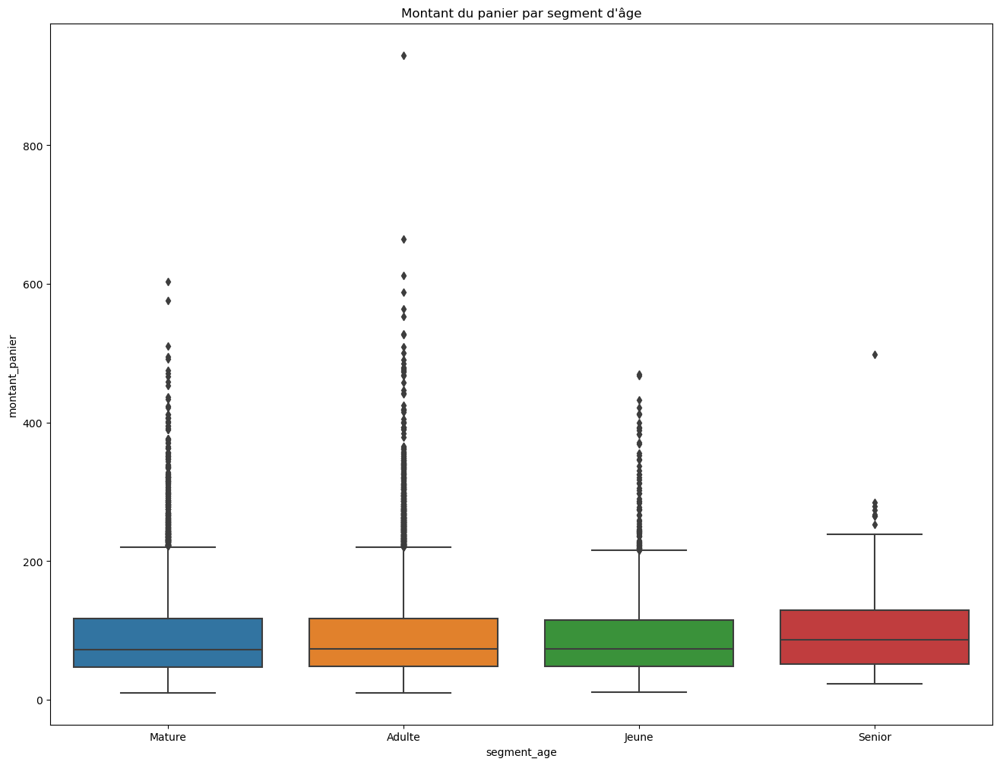

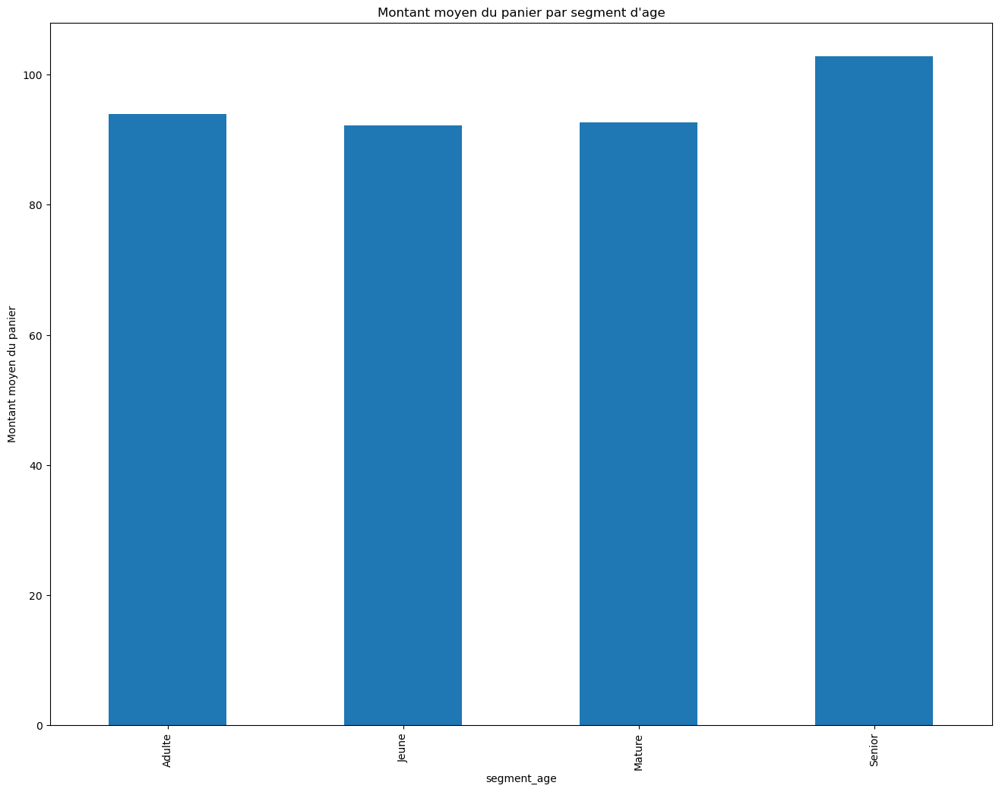

In [126]:
plt.figure(figsize=(16, 12))
sns.boxplot(data=df,
           x=var_quali_multi,
           y=var_quanti_multi)
plt.title("Montant du panier par segment d'âge")
plt.show()

groupe_means = df.groupby(var_quali_multi)[var_quanti_multi].mean()
plt.figure(figsize=(16, 12))
groupe_means.plot(kind="bar")
plt.ylabel("Montant moyen du panier")
plt.title("Montant moyen du panier par segment d'age")
plt.show()

In [128]:
# On crée une liste qui va contenir les valeurs numériques de chaque groupe
groups_multi = []

# On parcourt chaque groupe créé à partir de la variable qualitative
for nom_groupe, groupe in df.groupby(var_quali_multi):
    
    # On récupère la variable quantitative du groupe
    valeurs = groupe[var_quanti_multi]
    
    # On enlève les valeurs manquantes
    valeurs = valeurs.dropna()
    
    # On ajoute les valeurs du groupe à la liste
    groups_multi.append(valeurs.values)
    
    # Pour le test de Shapiro, on limite l’échantillon à 500 valeurs maximum
    taille_echantillon = min(len(valeurs), 500)
    echantillon = valeurs.sample(taille_echantillon, random_state=42)
    
    # Test de normalité de Shapiro-Wilk
    stat, p = shapiro(echantillon)
    
    # Affichage des résultats
    print(
        f"Shapiro pour {nom_groupe} : "
        f"stat={stat:.3f}, p={p:.3f}, n={len(valeurs)}"
    )

# Test de Levene pour vérifier l’égalité des variances entre les groupes
stat_lev_anova, p_lev_anova = stats.levene(*groups_multi)

# Affichage du résultat du test de Levene
print(
    f"\nTest de Levene (ANOVA) : "
    f"stat={stat_lev_anova:.3f}, p={p_lev_anova:.3f}"
)


Shapiro pour Adulte : stat=0.714, p=0.000, n=7608
Shapiro pour Jeune : stat=0.823, p=0.000, n=1676
Shapiro pour Mature : stat=0.821, p=0.000, n=5550
Shapiro pour Senior : stat=0.847, p=0.000, n=166

Test de Levene (ANOVA) : stat=1.364, p=0.252


## Anova et Kruskal-Wallis

In [129]:
f_stat, f_p = stats.f_oneway(*groups_multi)
print("ANOVA à un facteur")
print(f"F = {f_stat:.3f}, p = {f_p:.3e}\n")

kw_stat, kw_p = stats.kruskal(*groups_multi)
print("Test de Kruskal–Wallis")
print(f"H = {kw_stat:.3f}, p = {kw_p:.3e}")

ANOVA à un facteur
F = 1.696, p = 1.656e-01

Test de Kruskal–Wallis
H = 5.098, p = 1.648e-01


## Conclusion
- ANOVA significative → au moins un segment d'âge diffère des autres
- Si les hypothèses d’ANOVA ne sont pas satisfaites → On interprètre plutôt Kruskal–Wallis
- Pour voir quels groupes diffèrent, on utilise des tests post-hoc (Tukey / Dunn) dans un niveau avancé.

## Cas Quali & Quali (sexe - retour_produit)


In [130]:
var_quali_1 = "sexe"
var_quali_2 = "retour_produit"

table = pd.crosstab(df[var_quali_1], df[var_quali_2])
table

retour_produit,Non,Oui
sexe,,
Femme,6722,757
Homme,6718,803


In [131]:
# proportions(en %)

prop_pct = table.div(table.sum(axis=1), axis=0)*100
prop_pct

retour_produit,Non,Oui
sexe,,
Femme,89.878326,10.121674
Homme,89.323228,10.676772


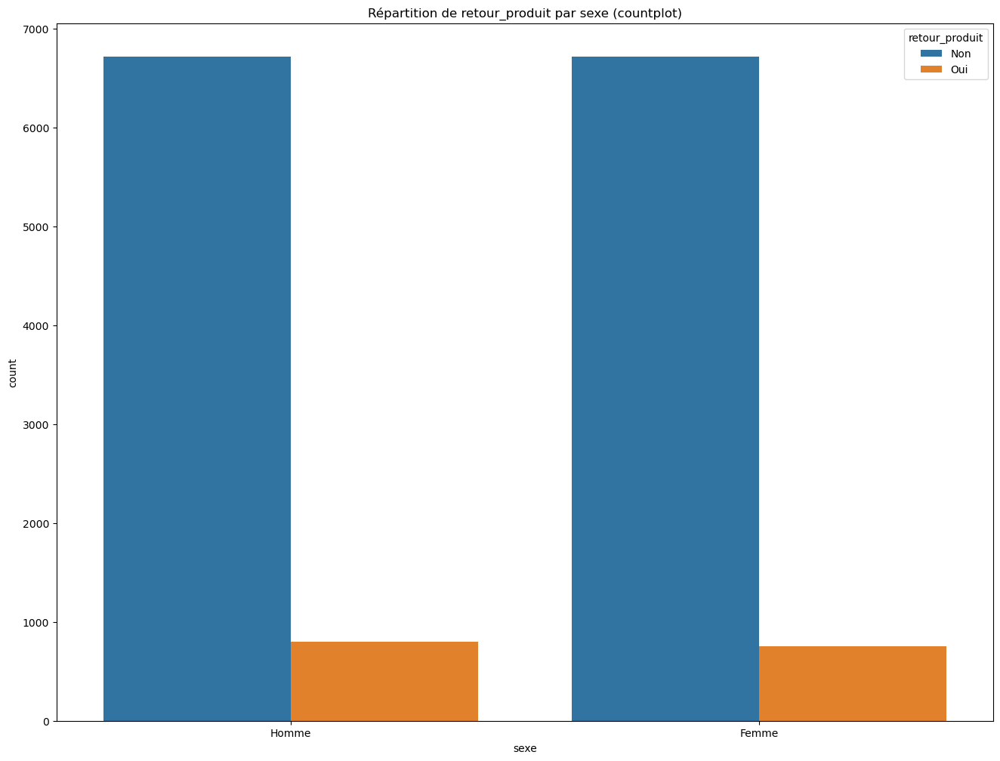

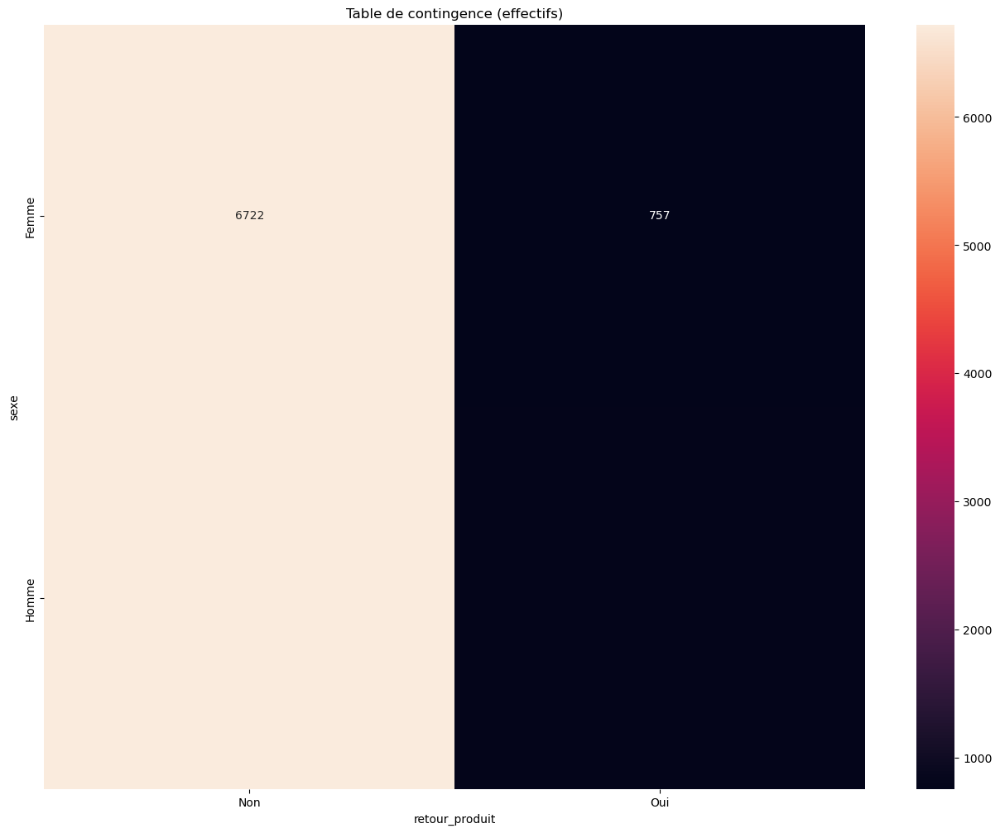

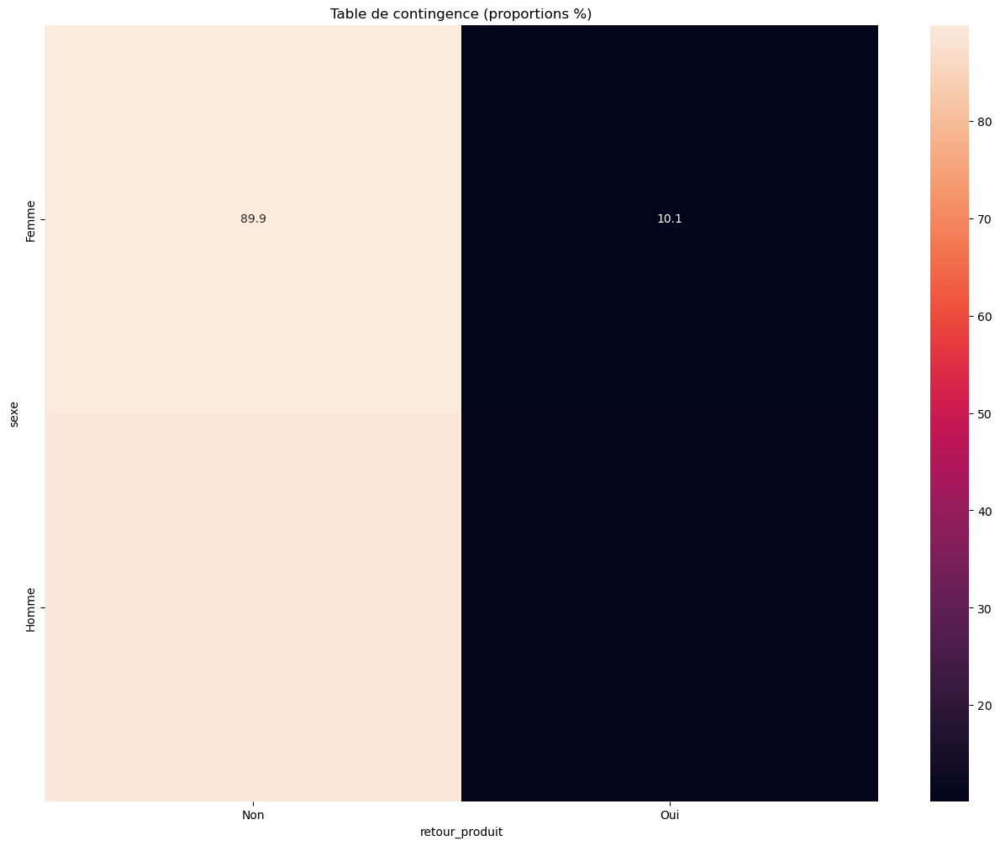

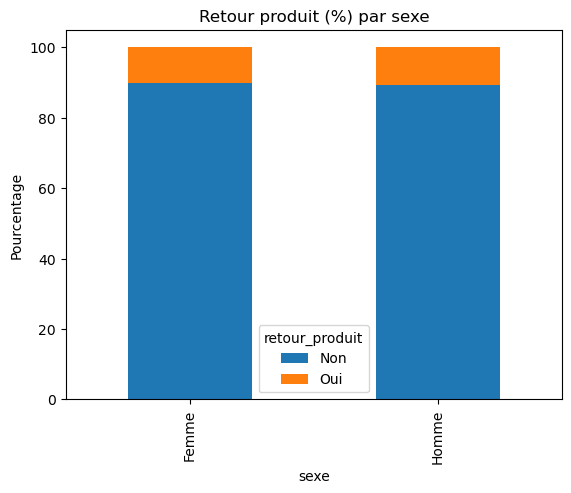

In [133]:

plt.figure(figsize=(16, 12))
sns.countplot(x=var_quali_1, hue=var_quali_2, data=df)
plt.title("Répartition de retour_produit par sexe (countplot)")
plt.show()

plt.figure(figsize=(16, 12))
sns.heatmap(table, annot=True, fmt="d")
plt.title("Table de contingence (effectifs)")
plt.ylabel(var_quali_1)
plt.xlabel(var_quali_2)
plt.show()

plt.figure(figsize=(16, 12))
sns.heatmap(table_prop, annot=True, fmt=".1f")
plt.title("Table de contingence (proportions %)")
plt.ylabel(var_quali_1)
plt.xlabel(var_quali_2)
plt.show()

table_prop.plot(kind="bar", stacked=True)
plt.ylabel("Pourcentage")
plt.title("Retour produit (%) par sexe")
plt.legend(title=var_quali_2)
plt.show()

## Test de Chi2, Fisher et V de Cramér

In [136]:
chi2, p_chi2, dof, expected = stats.chi2_contingency(table)
print(f"Test du Chi² : chi2 = {chi2:.3f}, p = {p_chi2:.3e}, ddl = {dof}")

Test du Chi² : chi2 = 1.181, p = 2.771e-01, ddl = 1


In [138]:
# test de Fisher
from scipy.stats import fisher_exact
oddsratio, p_fisher = fisher_exact(table)
print(f"Test exact de Fisher : odds ratio = {oddsratio:.3f}, p = {p_fisher:.3e}")

Test exact de Fisher : odds ratio = 1.061, p = 2.728e-01


In [139]:
# V de Cramér
n = table.to_numpy().sum()
phi2 = chi2 / n
r, k = table.shape
phi2_corr = max(0, phi2 - (k-1)*(r-1)/(n-1))
r_corr = r - (r-1)**2/(n-1)
k_corr = k - (k-1)**2/(n-1)
cramers_v = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
print(f"V de Cramér : {cramers_v:.3f}")

V de Cramér : 0.003


## Conclusion
- Si p(Chi²) < 0.05 → on rejette H0 : les variables sont associées.
- V de Cramér mesure la force de l'association (proche de 0 → faible, proche de 1 → forte).
- Toujours interpréter en regardant les proportions (% par sexe) et le contexte métier

Identifier le type de variables (quanti/quali).
Choisir le couple graphique + test adapté.
Vérifier les hypothèses (normalité, variances, effectifs).
Regarder la p-valeur mais aussi la taille de l'effet (écarts de moyennes, corrélations, V de Cramér).
Conclure dans un langage clair et compréhensible pour un non-statisticien.